In [2]:
import pandas as pd

# Veri setini yükle
file_path = r'C:\Users\bitir\OneDrive\Desktop\UP\UP-main\databases\3- ratio-of-female-to-male-labor-force-participation-rates-ilo-wdi.csv'
data = pd.read_csv(file_path)

# Code sütununu sil
data.drop(columns=['Code'], inplace=True)

# Yeni belgeyi oluştur ve kaydet
output_path = r'C:\Users\bitir\OneDrive\Desktop\UP\deneme\labor_forceratio.csv'
data.to_csv(output_path, index=False)

print("Yeni belge oluşturuldu ve kaydedildi.")


Yeni belge oluşturuldu ve kaydedildi.


In [4]:
def check_df(data_path):
    # Veriyi yükleme
    dataframe = pd.read_csv(data_path)

    print("##################### Shape #####################")
    print(dataframe.shape)
    print("##################### Types #####################")
    print(dataframe.dtypes)
    print("##################### Head #####################")
    print(dataframe.head(3))
    print("##################### Tail #####################")
    print(dataframe.tail(3))
    print("##################### NA #####################")
    print(dataframe.isnull().sum().to_frame().T.to_string(index=False))
    print("##################### Unique Entities #####################")
    print(dataframe['Entity'].unique())
    print(len(dataframe['Entity'].unique()))
# Veri çerçevesini kontrol etme
data_path = r"C:\Users\bitir\OneDrive\Desktop\UP\deneme\labor_forceratio.csv"
check_df(data_path)

##################### Shape #####################
(6432, 3)
##################### Types #####################
Entity     object
Year        int64
Ratio     float64
dtype: object
##################### Head #####################
        Entity  Year      Ratio
0  Afghanistan  1990  19.604805
1  Afghanistan  1991  19.713380
2  Afghanistan  1992  19.803307
##################### Tail #####################
        Entity  Year      Ratio
6429  Zimbabwe  2019  89.906880
6430  Zimbabwe  2020  89.044730
6431  Zimbabwe  2021  89.177246
##################### NA #####################
 Entity  Year  Ratio
      0     0      0
##################### Unique Entities #####################
['Afghanistan' 'Albania' 'Algeria' 'Angola' 'Argentina' 'Armenia'
 'Australia' 'Austria' 'Azerbaijan' 'Bahamas' 'Bahrain' 'Bangladesh'
 'Barbados' 'Belarus' 'Belgium' 'Belize' 'Benin' 'Bhutan' 'Bolivia'
 'Bosnia and Herzegovina' 'Botswana' 'Brazil' 'Brunei' 'Bulgaria'
 'Burkina Faso' 'Burundi' 'Cambodia' 'Cameroon' 'C

201 ülke değikenimiz var o yüzden önce aykırı değer olup olmadığını ülke bazında incelemk istiyorum.


In [6]:
import pandas as pd

# Veri setini yükle
file_path = r'C:\Users\bitir\OneDrive\Desktop\UP\deneme\labor_forceratio.csv'
data = pd.read_csv(file_path)

# Tüm Entities değerlerini al
unique_entities = data['Entity'].unique()

# Dosya yolunu ve adını belirt
output_file_path = r'C:\Users\bitir\OneDrive\Desktop\UP\deneme\unique_entities.txt'

# Entities değerlerini dosyaya yaz
with open(output_file_path, 'w') as f:
    for entity in unique_entities:
        f.write(entity + '\n')

print("Unique entities have been written to:", output_file_path)


Unique entities have been written to: C:\Users\bitir\OneDrive\Desktop\UP\deneme\unique_entities.txt


In [7]:
# Ülkelerin kıta bilgilerini içeren bir sözlük oluştur
continent_dict = {
    'Africa': ['Algeria', 'Angola', 'Benin', 'Botswana', 'Burkina Faso', 'Burundi', 'Cape Verde', 'Cameroon', 'Central African Republic', 'Chad', 'Comoros', 'Congo', 'Democratic Republic of Congo', 'Djibouti', 'Egypt', 'Equatorial Guinea', 'Eritrea', 'Eswatini', 'Ethiopia', 'Gabon', 'Gambia', 'Ghana', 'Guinea', 'Guinea-Bissau', 'Ivory Coast', 'Kenya', 'Lesotho', 'Liberia', 'Libya', 'Madagascar', 'Malawi', 'Mali', 'Mauritania', 'Mauritius', 'Morocco', 'Mozambique', 'Namibia', 'Niger', 'Nigeria', 'Rwanda', 'Sao Tome and Principe', 'Senegal', 'Seychelles', 'Sierra Leone', 'Somalia', 'South Africa', 'South Sudan', 'Sudan', 'Tanzania', 'Togo', 'Tunisia', 'Uganda', 'Zambia', 'Zimbabwe'],
    'Asia': ['Afghanistan', 'Armenia', 'Azerbaijan', 'Bahrain', 'Bangladesh', 'Bhutan', 'Brunei', 'Cambodia', 'China', 'Cyprus', 'Georgia', 'India', 'Indonesia', 'Iran', 'Iraq', 'Israel', 'Japan', 'Jordan', 'Kazakhstan', 'Kuwait', 'Kyrgyzstan', 'Laos', 'Lebanon', 'Malaysia', 'Maldives', 'Mongolia', 'Myanmar', 'Nepal', 'North Korea', 'Oman', 'Pakistan', 'Palestine', 'Philippines', 'Qatar', 'Saudi Arabia', 'Singapore', 'South Korea', 'Sri Lanka', 'Syria', 'Taiwan', 'Tajikistan', 'Thailand', 'Timor-Leste', 'Turkey', 'Turkmenistan', 'United Arab Emirates', 'Uzbekistan', 'Vietnam', 'Yemen'],
    'Europe': ['Albania', 'Andorra', 'Austria', 'Belarus', 'Belgium', 'Bosnia and Herzegovina', 'Bulgaria', 'Croatia', 'Czech Republic', 'Denmark', 'Estonia', 'Finland', 'France', 'Germany', 'Greece', 'Hungary', 'Iceland', 'Ireland', 'Italy', 'Kosovo', 'Latvia', 'Liechtenstein', 'Lithuania', 'Luxembourg', 'Malta', 'Moldova', 'Monaco', 'Montenegro', 'Netherlands', 'North Macedonia', 'Norway', 'Poland', 'Portugal', 'Romania', 'Russia', 'San Marino', 'Serbia', 'Slovakia', 'Slovenia', 'Spain', 'Sweden', 'Switzerland', 'Ukraine', 'United Kingdom', 'Vatican City'],
    'North America': ['Antigua and Barbuda', 'Bahamas', 'Barbados', 'Belize', 'Canada', 'Costa Rica', 'Cuba', 'Dominica', 'Dominican Republic', 'El Salvador', 'Grenada', 'Guatemala', 'Haiti', 'Honduras', 'Jamaica', 'Mexico', 'Nicaragua', 'Panama', 'Saint Kitts and Nevis', 'Saint Lucia', 'Saint Vincent and the Grenadines', 'Trinidad and Tobago', 'United States'],
    'Oceania': ['Australia', 'Fiji', 'Kiribati', 'Marshall Islands', 'Micronesia', 'Nauru', 'New Zealand', 'Palau', 'Papua New Guinea', 'Samoa', 'Solomon Islands', 'Tonga', 'Tuvalu', 'Vanuatu'],
    'South America': ['Argentina', 'Bolivia', 'Brazil', 'Chile', 'Colombia', 'Ecuador', 'Guyana', 'Paraguay', 'Peru', 'Suriname', 'Uruguay', 'Venezuela']
}

# Her kıtanın kaç ülkeden oluştuğunu hesapla
continent_count = {continent: len(countries) for continent, countries in continent_dict.items()}

# Toplamda kaç kıta olduğunu hesapla
total_continents = len(continent_count)

# Sonuçları göster
print("Her kıtanın ülke sayısı:")
for continent, count in continent_count.items():
    print(f"{continent}: {count} ülke")

print("\nToplam kıta sayısı:", total_continents)


Her kıtanın ülke sayısı:
Africa: 54 ülke
Asia: 49 ülke
Europe: 45 ülke
North America: 23 ülke
Oceania: 14 ülke
South America: 12 ülke

Toplam kıta sayısı: 6


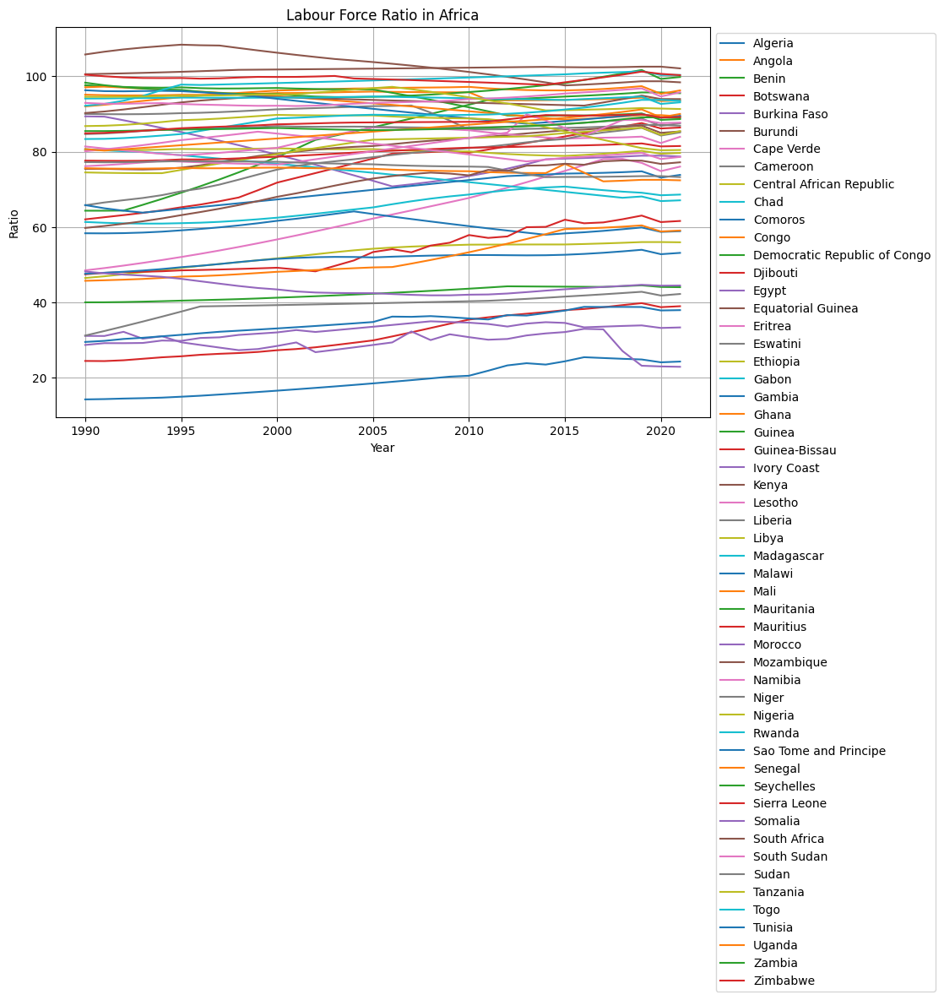

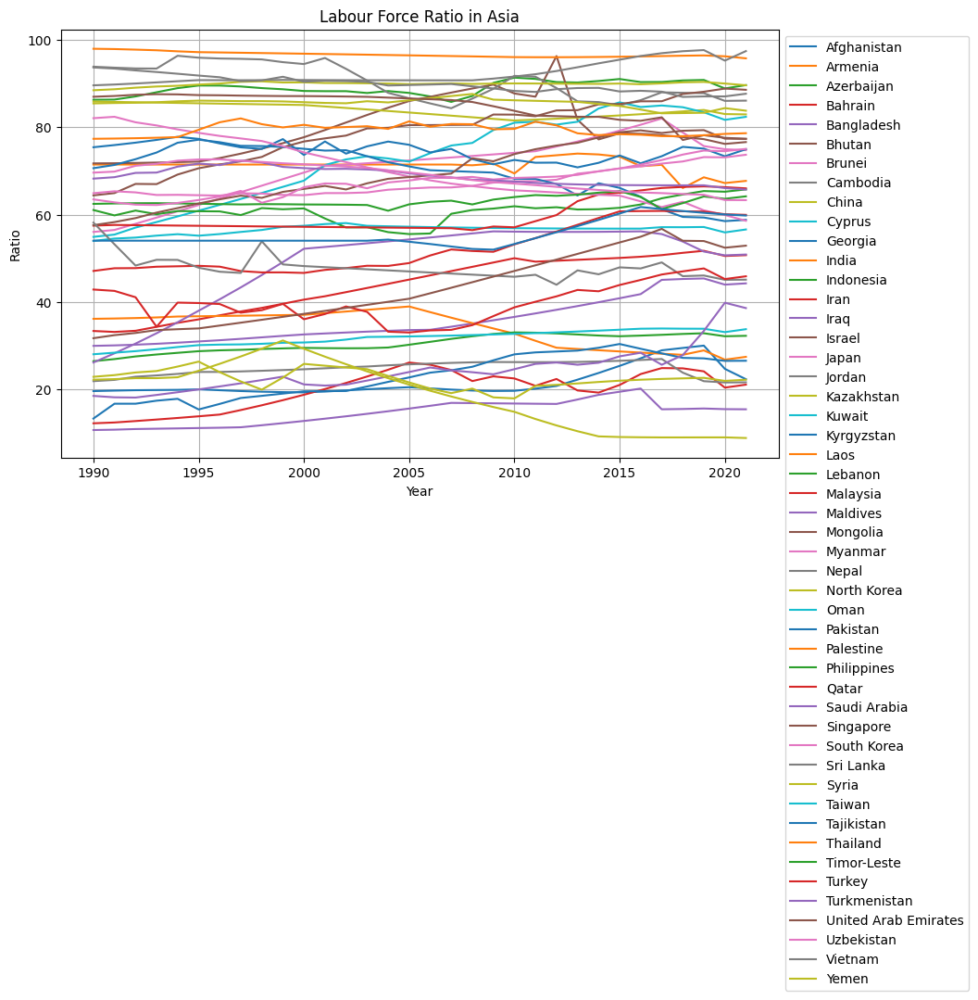

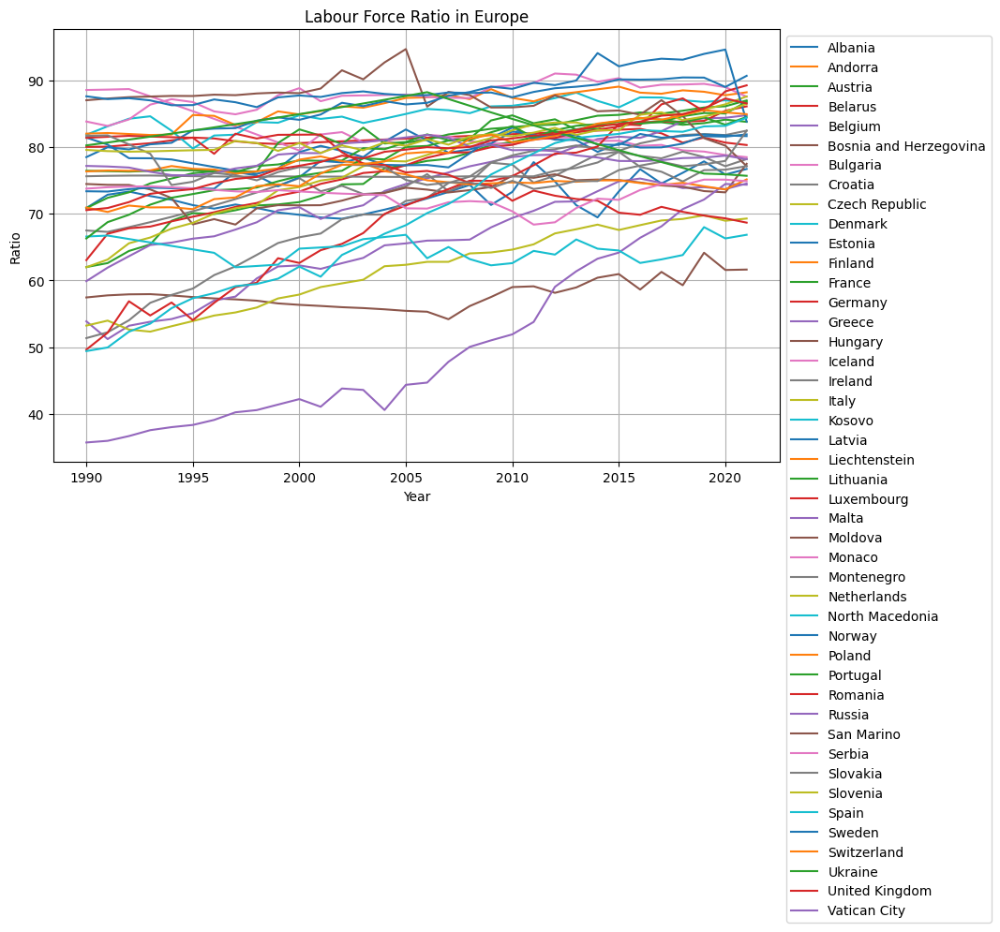

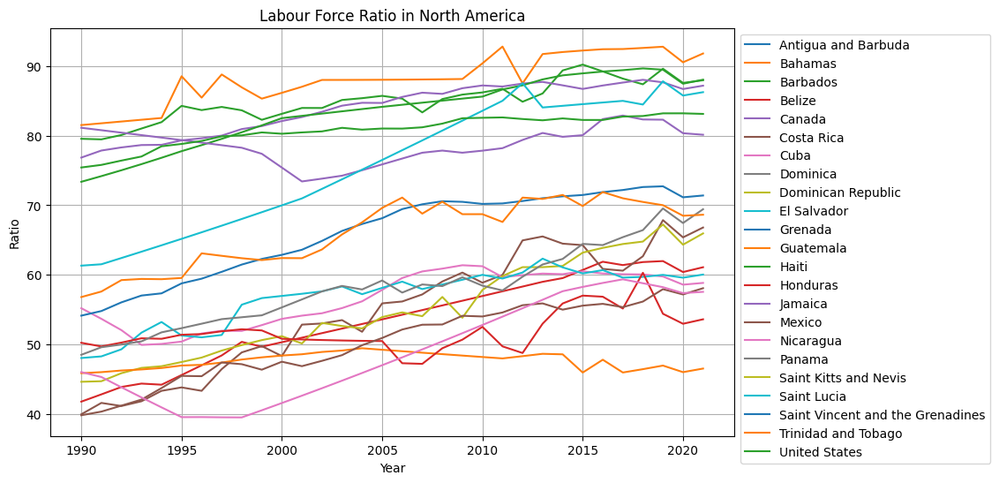

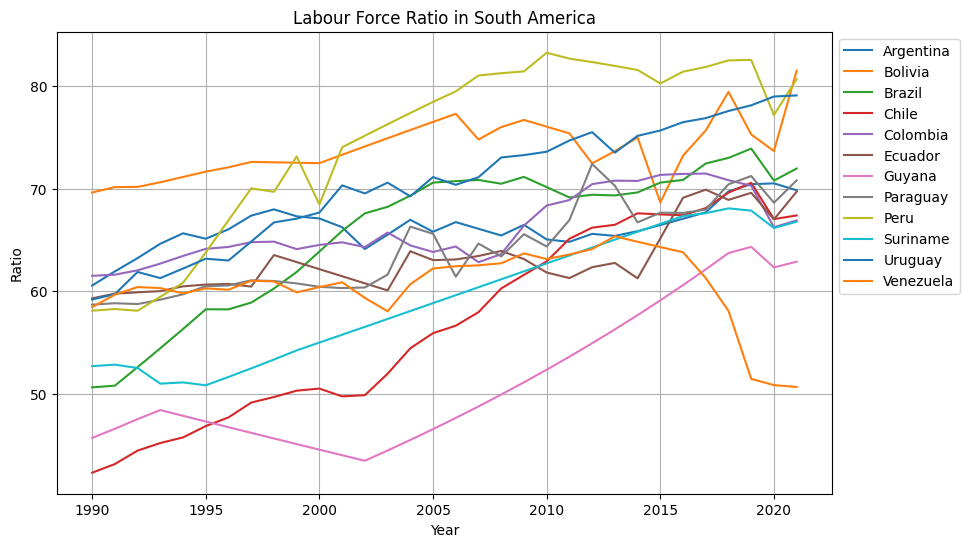

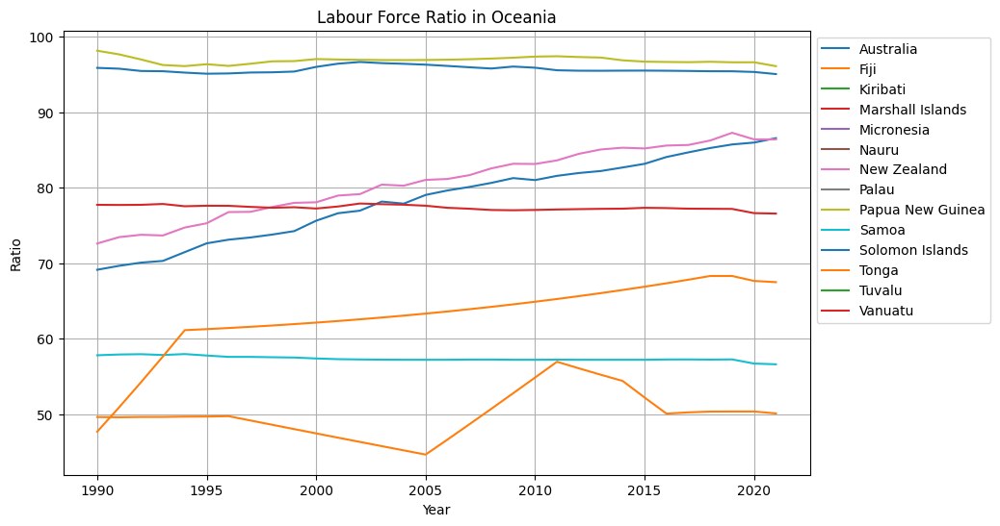

In [8]:
import pandas as pd
import matplotlib.pyplot as plt

# Verileri dosyadan oku
data = pd.read_csv("C:/Users/bitir/OneDrive/Desktop/UP/deneme/labor_forceratio.csv")

# Her kıtanın ülke listesini ve yıllara göre oranları belirle
continents = {
    'Africa': ['Algeria', 'Angola', 'Benin', 'Botswana', 'Burkina Faso', 'Burundi', 'Cape Verde', 'Cameroon', 'Central African Republic', 'Chad', 'Comoros', 'Congo', 'Democratic Republic of Congo', 'Djibouti', 'Egypt', 'Equatorial Guinea', 'Eritrea', 'Eswatini', 'Ethiopia', 'Gabon', 'Gambia', 'Ghana', 'Guinea', 'Guinea-Bissau', 'Ivory Coast', 'Kenya', 'Lesotho', 'Liberia', 'Libya', 'Madagascar', 'Malawi', 'Mali', 'Mauritania', 'Mauritius', 'Morocco', 'Mozambique', 'Namibia', 'Niger', 'Nigeria', 'Rwanda', 'Sao Tome and Principe', 'Senegal', 'Seychelles', 'Sierra Leone', 'Somalia', 'South Africa', 'South Sudan', 'Sudan', 'Tanzania', 'Togo', 'Tunisia', 'Uganda', 'Zambia', 'Zimbabwe'],
    'Asia': ['Afghanistan', 'Armenia', 'Azerbaijan', 'Bahrain', 'Bangladesh', 'Bhutan', 'Brunei', 'Cambodia', 'China', 'Cyprus', 'Georgia', 'India', 'Indonesia', 'Iran', 'Iraq', 'Israel', 'Japan', 'Jordan', 'Kazakhstan', 'Kuwait', 'Kyrgyzstan', 'Laos', 'Lebanon', 'Malaysia', 'Maldives', 'Mongolia', 'Myanmar', 'Nepal', 'North Korea', 'Oman', 'Pakistan', 'Palestine', 'Philippines', 'Qatar', 'Saudi Arabia', 'Singapore', 'South Korea', 'Sri Lanka', 'Syria', 'Taiwan', 'Tajikistan', 'Thailand', 'Timor-Leste', 'Turkey', 'Turkmenistan', 'United Arab Emirates', 'Uzbekistan', 'Vietnam', 'Yemen'],
    'Europe': ['Albania', 'Andorra', 'Austria', 'Belarus', 'Belgium', 'Bosnia and Herzegovina', 'Bulgaria', 'Croatia', 'Czech Republic', 'Denmark', 'Estonia', 'Finland', 'France', 'Germany', 'Greece', 'Hungary', 'Iceland', 'Ireland', 'Italy', 'Kosovo', 'Latvia', 'Liechtenstein', 'Lithuania', 'Luxembourg', 'Malta', 'Moldova', 'Monaco', 'Montenegro', 'Netherlands', 'North Macedonia', 'Norway', 'Poland', 'Portugal', 'Romania', 'Russia', 'San Marino', 'Serbia', 'Slovakia', 'Slovenia', 'Spain', 'Sweden', 'Switzerland', 'Ukraine', 'United Kingdom', 'Vatican City'],
    'North America': ['Antigua and Barbuda', 'Bahamas', 'Barbados', 'Belize', 'Canada', 'Costa Rica', 'Cuba', 'Dominica', 'Dominican Republic', 'El Salvador', 'Grenada', 'Guatemala', 'Haiti', 'Honduras', 'Jamaica', 'Mexico', 'Nicaragua', 'Panama', 'Saint Kitts and Nevis', 'Saint Lucia', 'Saint Vincent and the Grenadines', 'Trinidad and Tobago', 'United States'],
    'South America': ['Argentina', 'Bolivia', 'Brazil', 'Chile', 'Colombia', 'Ecuador', 'Guyana', 'Paraguay', 'Peru', 'Suriname', 'Uruguay', 'Venezuela'],
    'Oceania': ['Australia', 'Fiji', 'Kiribati', 'Marshall Islands', 'Micronesia', 'Nauru', 'New Zealand', 'Palau', 'Papua New Guinea', 'Samoa', 'Solomon Islands', 'Tonga', 'Tuvalu', 'Vanuatu']
}

# Her kıta için bir grafik oluştur
for continent, countries in continents.items():
    continent_data = data[data['Entity'].isin(countries)]
    plt.figure(figsize=(10, 6))
    for country in countries:
        country_data = continent_data[continent_data['Entity'] == country]
        plt.plot(country_data['Year'], country_data['Ratio'], label=country)
    plt.title(f"Labour Force Ratio in {continent}")
    plt.xlabel('Year')
    plt.ylabel('Ratio')
    plt.legend(loc='upper left', bbox_to_anchor=(1,1))
    plt.grid(True)
    plt.show()


Bu grafikler, her kıtaya ait ülkelerin yıllara göre işgücüne katılım oranını göstermektedir. İşgücüne katılım oranı, çalışma çağındaki nüfusun işgücünde yer alma oranını ifade eder ve genellikle yüzde olarak ifade edilir. Bu oran, belirli bir yıl içindeki çalışan nüfusun, o yaş grubundaki toplam nüfusa oranını gösterir.

Grafiklerde her bir çizgi bir ülkeyi temsil eder. Y ekseni işgücüne katılım oranını, X ekseni ise yılları temsil eder. Bu grafiklerdeki eğilimler, belirli bir kıtanın veya ülkenin işgücüne katılım oranındaki değişiklikleri zaman içinde gösterir. Örneğin, belirli bir kıtadaki işgücüne katılım oranının artması, o bölgedeki ekonomik büyümeyi veya işgücü piyasasındaki gelişmeleri yansıtabilir. Tam tersi durumda, işgücüne katılım oranının düşmesi, ekonomik durgunluğu veya demografik değişiklikleri işaret edebilir.

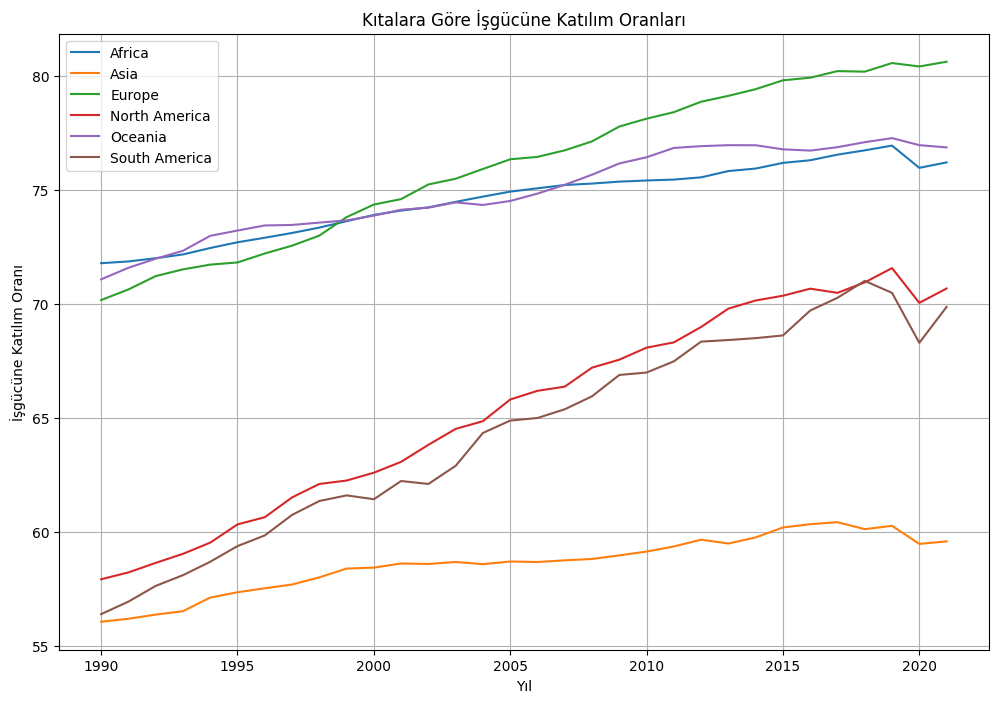

In [9]:
import pandas as pd
import matplotlib.pyplot as plt

# Veri dosyasını yükle
file_path = "C:/Users/bitir/OneDrive/Desktop/UP/deneme/labor_forceratio.csv"
data = pd.read_csv(file_path)

# Kıtaların listesi
continents = {
    "Africa": ["Algeria", "Angola", "Benin", "Botswana", "Burkina Faso", "Burundi", "Cameroon", "Cape Verde",
               "Central African Republic", "Chad", "Comoros", "Congo", "Democratic Republic of Congo", "Djibouti",
               "Egypt", "Equatorial Guinea", "Eritrea", "Eswatini", "Ethiopia", "Gabon", "Gambia", "Ghana", "Guinea",
               "Guinea-Bissau", "Ivory Coast", "Kenya", "Lesotho", "Liberia", "Libya", "Madagascar", "Malawi", "Mali",
               "Mauritania", "Mauritius", "Morocco", "Mozambique", "Namibia", "Niger", "Nigeria", "Rwanda", "Sao Tome and Principe",
               "Senegal", "Seychelles", "Sierra Leone", "Somalia", "South Africa", "South Sudan", "Sudan", "Tanzania", "Togo", "Tunisia",
               "Uganda", "Zambia", "Zimbabwe"],
    "Asia": ["Afghanistan", "Armenia", "Azerbaijan", "Bahrain", "Bangladesh", "Bhutan", "Brunei", "Cambodia", "China",
             "East Timor", "Georgia", "India", "Indonesia", "Iran", "Iraq", "Israel", "Japan", "Jordan", "Kazakhstan",
             "Kuwait", "Kyrgyzstan", "Laos", "Lebanon", "Malaysia", "Maldives", "Mongolia", "Myanmar", "Nepal",
             "North Korea", "Oman", "Pakistan", "Palestine", "Philippines", "Qatar", "Saudi Arabia", "Singapore",
             "South Korea", "Sri Lanka", "Syria", "Tajikistan", "Thailand", "Turkey", "Turkmenistan", "United Arab Emirates",
             "Uzbekistan", "Vietnam", "Yemen"],
    "Europe": ["Albania", "Andorra", "Austria", "Belarus", "Belgium", "Bosnia and Herzegovina", "Bulgaria", "Croatia",
               "Cyprus", "Czech Republic", "Denmark", "Estonia", "Finland", "France", "Germany", "Greece", "Hungary",
               "Iceland", "Ireland", "Italy", "Kosovo", "Latvia", "Liechtenstein", "Lithuania", "Luxembourg", "Malta",
               "Moldova", "Monaco", "Montenegro", "Netherlands", "North Macedonia", "Norway", "Poland", "Portugal",
               "Romania", "Russia", "San Marino", "Serbia", "Slovakia", "Slovenia", "Spain", "Sweden", "Switzerland",
               "Ukraine", "United Kingdom", "Vatican City"],
    "North America": ["Antigua and Barbuda", "Bahamas", "Barbados", "Belize", "Canada", "Costa Rica", "Cuba", "Dominica",
                      "Dominican Republic", "El Salvador", "Grenada", "Guatemala", "Haiti", "Honduras", "Jamaica",
                      "Mexico", "Nicaragua", "Panama", "Saint Kitts and Nevis", "Saint Lucia", "Saint Vincent and the Grenadines",
                      "Trinidad and Tobago", "United States"],
    "Oceania": ["Australia", "Fiji", "Kiribati", "Marshall Islands", "Micronesia", "Nauru", "New Zealand", "Palau", "Papua New Guinea",
                "Samoa", "Solomon Islands", "Tonga", "Tuvalu", "Vanuatu"],
    "South America": ["Argentina", "Bolivia", "Brazil", "Chile", "Colombia", "Ecuador", "Guyana", "Paraguay", "Peru", "Suriname",
                       "Uruguay", "Venezuela"]
}

# Kıta bazında işgücüne katılım oranlarını hesapla
continent_ratios = {}
for continent, countries in continents.items():
    continent_data = data[data['Entity'].isin(countries)]
    continent_ratio = continent_data.groupby('Year')['Ratio'].mean()
    continent_ratios[continent] = continent_ratio

# Grafikleri çiz
plt.figure(figsize=(12, 8))
for continent, ratio in continent_ratios.items():
    plt.plot(ratio.index, ratio.values, label=continent)

plt.title('Kıtalara Göre İşgücüne Katılım Oranları')
plt.xlabel('Yıl')
plt.ylabel('İşgücüne Katılım Oranı')
plt.legend()
plt.grid(True)
plt.show()


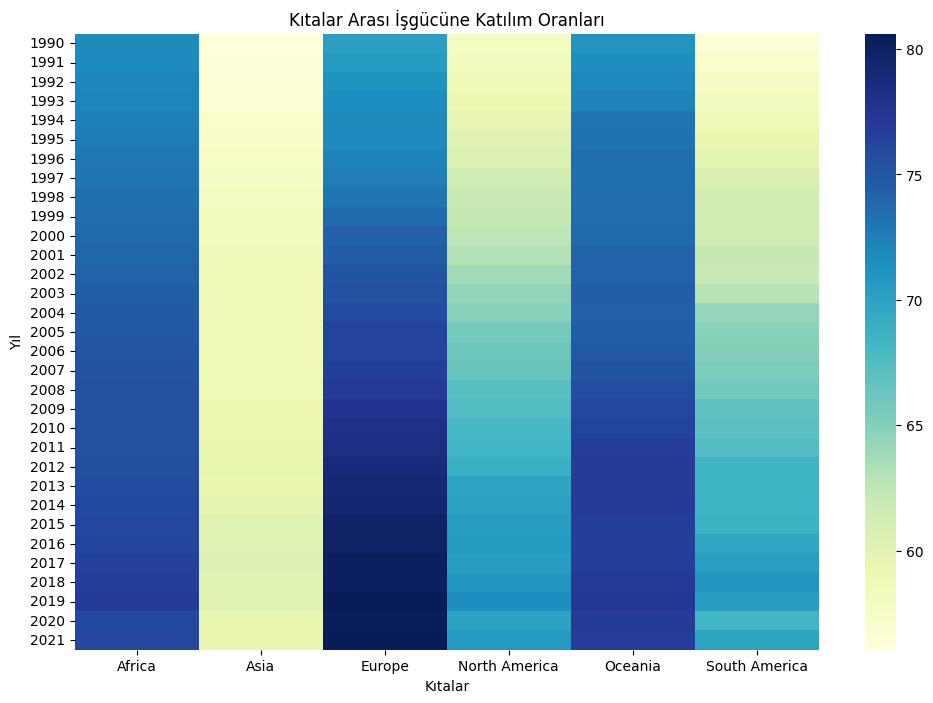

In [10]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Veri dosyasını yükle
file_path = "C:/Users/bitir/OneDrive/Desktop/UP/deneme/labor_forceratio.csv"
data = pd.read_csv(file_path)

# Kıtaların listesi
continents = {
    "Africa": ["Algeria", "Angola", "Benin", "Botswana", "Burkina Faso", "Burundi", "Cameroon", "Cape Verde",
               "Central African Republic", "Chad", "Comoros", "Congo", "Democratic Republic of Congo", "Djibouti",
               "Egypt", "Equatorial Guinea", "Eritrea", "Eswatini", "Ethiopia", "Gabon", "Gambia", "Ghana", "Guinea",
               "Guinea-Bissau", "Ivory Coast", "Kenya", "Lesotho", "Liberia", "Libya", "Madagascar", "Malawi", "Mali",
               "Mauritania", "Mauritius", "Morocco", "Mozambique", "Namibia", "Niger", "Nigeria", "Rwanda", "Sao Tome and Principe",
               "Senegal", "Seychelles", "Sierra Leone", "Somalia", "South Africa", "South Sudan", "Sudan", "Tanzania", "Togo", "Tunisia",
               "Uganda", "Zambia", "Zimbabwe"],
    "Asia": ["Afghanistan", "Armenia", "Azerbaijan", "Bahrain", "Bangladesh", "Bhutan", "Brunei", "Cambodia", "China",
             "East Timor", "Georgia", "India", "Indonesia", "Iran", "Iraq", "Israel", "Japan", "Jordan", "Kazakhstan",
             "Kuwait", "Kyrgyzstan", "Laos", "Lebanon", "Malaysia", "Maldives", "Mongolia", "Myanmar", "Nepal",
             "North Korea", "Oman", "Pakistan", "Palestine", "Philippines", "Qatar", "Saudi Arabia", "Singapore",
             "South Korea", "Sri Lanka", "Syria", "Tajikistan", "Thailand", "Turkey", "Turkmenistan", "United Arab Emirates",
             "Uzbekistan", "Vietnam", "Yemen"],
    "Europe": ["Albania", "Andorra", "Austria", "Belarus", "Belgium", "Bosnia and Herzegovina", "Bulgaria", "Croatia",
               "Cyprus", "Czech Republic", "Denmark", "Estonia", "Finland", "France", "Germany", "Greece", "Hungary",
               "Iceland", "Ireland", "Italy", "Kosovo", "Latvia", "Liechtenstein", "Lithuania", "Luxembourg", "Malta",
               "Moldova", "Monaco", "Montenegro", "Netherlands", "North Macedonia", "Norway", "Poland", "Portugal",
               "Romania", "Russia", "San Marino", "Serbia", "Slovakia", "Slovenia", "Spain", "Sweden", "Switzerland",
               "Ukraine", "United Kingdom", "Vatican City"],
    "North America": ["Antigua and Barbuda", "Bahamas", "Barbados", "Belize", "Canada", "Costa Rica", "Cuba", "Dominica",
                      "Dominican Republic", "El Salvador", "Grenada", "Guatemala", "Haiti", "Honduras", "Jamaica",
                      "Mexico", "Nicaragua", "Panama", "Saint Kitts and Nevis", "Saint Lucia", "Saint Vincent and the Grenadines",
                      "Trinidad and Tobago", "United States"],
    "Oceania": ["Australia", "Fiji", "Kiribati", "Marshall Islands", "Micronesia", "Nauru", "New Zealand", "Palau", "Papua New Guinea",
                "Samoa", "Solomon Islands", "Tonga", "Tuvalu", "Vanuatu"],
    "South America": ["Argentina", "Bolivia", "Brazil", "Chile", "Colombia", "Ecuador", "Guyana", "Paraguay", "Peru", "Suriname",
                       "Uruguay", "Venezuela"]
}

# Kıta bazında işgücüne katılım oranlarını hesapla
continent_ratios = {}
for continent, countries in continents.items():
    continent_data = data[data['Entity'].isin(countries)]
    continent_ratio = continent_data.groupby('Year')['Ratio'].mean()
    continent_ratios[continent] = continent_ratio

# Kıta bazında işgücüne katılım oranlarını DataFrame'e dönüştür
df_continent_ratios = pd.DataFrame(continent_ratios)

# Heatmap'i çiz
plt.figure(figsize=(12, 8))
sns.heatmap(df_continent_ratios, cmap="YlGnBu")
plt.title('Kıtalar Arası İşgücüne Katılım Oranları')
plt.xlabel('Kıtalar')
plt.ylabel('Yıl')
plt.show()


Bu kod, her bir kıtanın yıllara göre işgücüne katılım oranlarını heatmap olarak gösterir. Y ekseni yılları, X ekseni ise kıtaları temsil eder. Renkler, işgücüne katılım oranlarının farklı seviyelerini gösterir. Daha koyu renkler daha yüksek işgücüne katılım oranlarını, daha açık renkler ise daha düşük işgücüne katılım oranlarını temsil eder.

In [ ]:
korealsyonun iyi olması için şimdi de önce bazı dataların ortlamasını alarak data karmaşasının önüne geçerek tekrar denicem.

In [14]:
import pandas as pd

# Veri setini yükle
file_path = "C:/Users/bitir/OneDrive/Desktop/UP/deneme/labor_forceratio.csv"
data = pd.read_csv(file_path)

# Tüm Entity'lerin listesini al
entities = data['Entity'].unique()

# Ortalama Ratio değerlerini tutacak bir DataFrame oluştur
average_ratio_df = pd.DataFrame(columns=['Entity', 'Average_Ratio'])

# Her bir Entity için ortalama Ratio değerini hesapla
for entity in entities:
    # Belirli bir ülkenin verilerini filtrele
    entity_data = data[data['Entity'] == entity]
    
    # Yıllara göre gruplayıp ortalama değerleri al
    average_ratio_by_year = entity_data.groupby('Year')['Ratio'].mean().reset_index()
    
    # Ortalama Ratio değerlerini hesapla
    average_ratio = average_ratio_by_year['Ratio'].mean()
    
    # Yeni DataFrame'e ekle
    average_ratio_df = pd.concat([average_ratio_df, pd.DataFrame({'Entity': [entity], 'Average_Ratio': [average_ratio]})], ignore_index=True)

# Yeni DataFrame'i CSV dosyasına yaz
output_path = "C:/Users/bitir/OneDrive/Desktop/UP/deneme/average_ratio_all_entities.csv"
average_ratio_df.to_csv(output_path, index=False)



C:\Users\bitir\AppData\Local\Temp\ipykernel_14752\3169083905.py:25: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  average_ratio_df = pd.concat([average_ratio_df, pd.DataFrame({'Entity': [entity], 'Average_Ratio': [average_ratio]})], ignore_index=True)


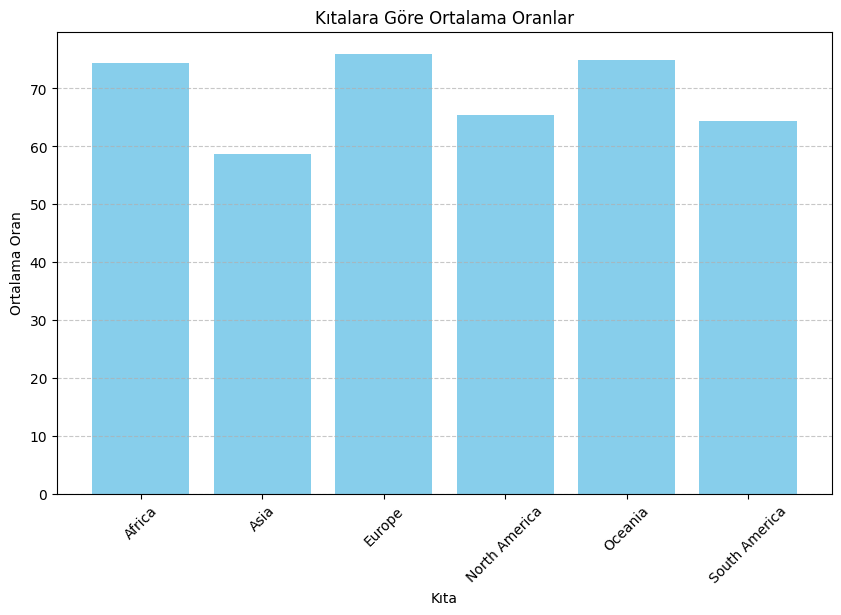

In [21]:
import pandas as pd
import matplotlib.pyplot as plt

# Veri setini yükle
file_path = "average_ratio_all_entities.csv"
data = pd.read_csv(file_path)

# Kıta bilgilerini içeren bir sözlük
continents = {
    "Africa": ["Algeria", "Angola", "Benin", "Botswana", "Burkina Faso", "Burundi", "Cameroon", "Cape Verde",
               "Central African Republic", "Chad", "Comoros", "Congo", "Democratic Republic of Congo", "Djibouti",
               "Egypt", "Equatorial Guinea", "Eritrea", "Eswatini", "Ethiopia", "Gabon", "Gambia", "Ghana", "Guinea",
               "Guinea-Bissau", "Cote d'Ivoire", "Kenya", "Lesotho", "Liberia", "Libya", "Madagascar", "Malawi", "Mali",
               "Mauritania", "Mauritius", "Morocco", "Mozambique", "Namibia", "Niger", "Nigeria", "Rwanda", "Sao Tome and Principe",
               "Senegal", "Sierra Leone", "Somalia", "South Africa", "South Sudan", "Sudan", "Tanzania", "Togo", "Tunisia",
               "Uganda", "Zambia", "Zimbabwe"],
    "Asia": ["Afghanistan", "Armenia", "Azerbaijan", "Bahrain", "Bangladesh", "Bhutan", "Brunei", "Cambodia", "China",
             "East Timor", "Georgia", "India", "Indonesia", "Iran", "Iraq", "Israel", "Japan", "Jordan", "Kazakhstan",
             "Kuwait", "Kyrgyzstan", "Laos", "Lebanon", "Malaysia", "Maldives", "Mongolia", "Myanmar", "Nepal",
             "North Korea", "Oman", "Pakistan", "Philippines", "Qatar", "Saudi Arabia", "Singapore",
             "South Korea", "Sri Lanka", "Syria", "Tajikistan", "Thailand", "Turkey", "Turkmenistan", "United Arab Emirates",
             "Uzbekistan", "Vietnam", "Yemen"],
    "Europe": ["Albania", "Andorra", "Austria", "Belarus", "Belgium", "Bosnia and Herzegovina", "Bulgaria", "Croatia",
               "Cyprus", "Czechia", "Denmark", "Estonia", "Finland", "France", "Germany", "Greece", "Hungary",
               "Iceland", "Ireland", "Italy", "Kosovo", "Latvia", "Liechtenstein", "Lithuania", "Luxembourg", "Malta",
               "Moldova", "Monaco", "Montenegro", "Netherlands", "North Macedonia", "Norway", "Poland", "Portugal",
               "Romania", "Russia", "San Marino", "Serbia", "Slovakia", "Slovenia", "Spain", "Sweden", "Switzerland",
               "Ukraine", "United Kingdom", "Vatican City"],
    "North America": ["Antigua and Barbuda", "Bahamas", "Barbados", "Belize", "Canada", "Costa Rica", "Cuba", "Dominica",
                      "Dominican Republic", "El Salvador", "Grenada", "Guatemala", "Haiti", "Honduras", "Jamaica",
                      "Mexico", "Nicaragua", "Panama", "Saint Kitts and Nevis", "Saint Lucia", "Saint Vincent and the Grenadines",
                      "Trinidad and Tobago", "United States"],
    "Oceania": ["Australia", "Fiji", "Kiribati", "Marshall Islands", "Micronesia", "Nauru", "New Zealand", "Palau", "Papua New Guinea",
                "Samoa", "Solomon Islands", "Tonga", "Tuvalu", "Vanuatu"],
    "South America": ["Argentina", "Bolivia", "Brazil", "Chile", "Colombia", "Ecuador", "Guyana", "Paraguay", "Peru", "Suriname",
                       "Uruguay", "Venezuela"]
}

# Her kıtadaki ülkelerin ortalama oranlarını tutacak bir sözlük oluştur
continent_average_ratios = {}

# Her kıtada bulunan ülkelerin ortalama oranlarını hesapla
for continent, countries in continents.items():
    continent_data = data[data['Entity'].isin(countries)]
    average_ratio = continent_data['Average_Ratio'].mean()
    continent_average_ratios[continent] = average_ratio

# Sonuçları görselleştir
plt.figure(figsize=(10, 6))
plt.bar(continent_average_ratios.keys(), continent_average_ratios.values(), color='skyblue')
plt.title('Kıtalara Göre Ortalama Oranlar')
plt.xlabel('Kıta')
plt.ylabel('Ortalama Oran')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()



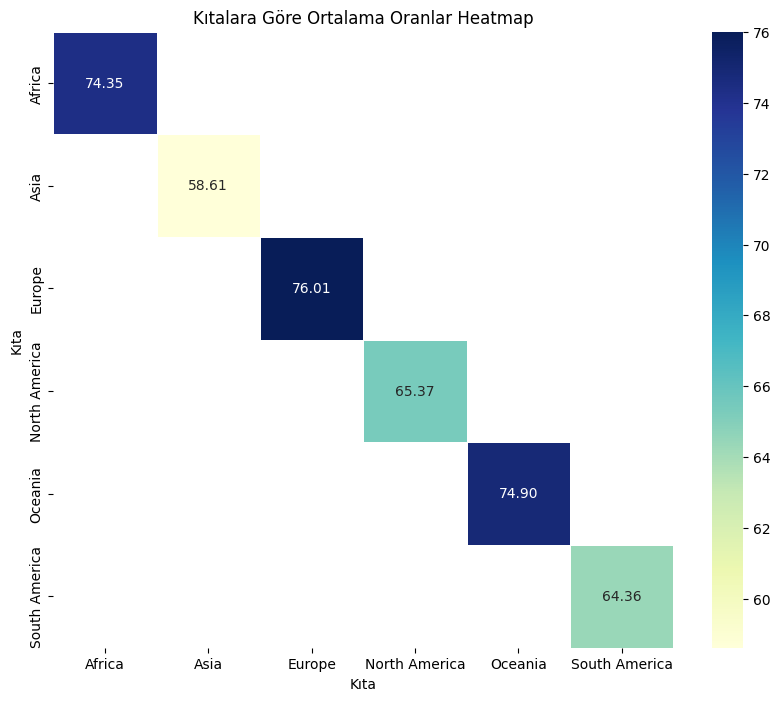

In [22]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Veri setini yükle
file_path = "average_ratio_all_entities.csv"
data = pd.read_csv(file_path)

# Kıta bilgilerini içeren bir sözlük
continents = {
    "Africa": ["Algeria", "Angola", "Benin", "Botswana", "Burkina Faso", "Burundi", "Cameroon", "Cape Verde",
               "Central African Republic", "Chad", "Comoros", "Congo", "Democratic Republic of Congo", "Djibouti",
               "Egypt", "Equatorial Guinea", "Eritrea", "Eswatini", "Ethiopia", "Gabon", "Gambia", "Ghana", "Guinea",
               "Guinea-Bissau", "Cote d'Ivoire", "Kenya", "Lesotho", "Liberia", "Libya", "Madagascar", "Malawi", "Mali",
               "Mauritania", "Mauritius", "Morocco", "Mozambique", "Namibia", "Niger", "Nigeria", "Rwanda", "Sao Tome and Principe",
               "Senegal", "Sierra Leone", "Somalia", "South Africa", "South Sudan", "Sudan", "Tanzania", "Togo", "Tunisia",
               "Uganda", "Zambia", "Zimbabwe"],
    "Asia": ["Afghanistan", "Armenia", "Azerbaijan", "Bahrain", "Bangladesh", "Bhutan", "Brunei", "Cambodia", "China",
             "East Timor", "Georgia", "India", "Indonesia", "Iran", "Iraq", "Israel", "Japan", "Jordan", "Kazakhstan",
             "Kuwait", "Kyrgyzstan", "Laos", "Lebanon", "Malaysia", "Maldives", "Mongolia", "Myanmar", "Nepal",
             "North Korea", "Oman", "Pakistan", "Philippines", "Qatar", "Saudi Arabia", "Singapore",
             "South Korea", "Sri Lanka", "Syria", "Tajikistan", "Thailand", "Turkey", "Turkmenistan", "United Arab Emirates",
             "Uzbekistan", "Vietnam", "Yemen"],
    "Europe": ["Albania", "Andorra", "Austria", "Belarus", "Belgium", "Bosnia and Herzegovina", "Bulgaria", "Croatia",
               "Cyprus", "Czechia", "Denmark", "Estonia", "Finland", "France", "Germany", "Greece", "Hungary",
               "Iceland", "Ireland", "Italy", "Kosovo", "Latvia", "Liechtenstein", "Lithuania", "Luxembourg", "Malta",
               "Moldova", "Monaco", "Montenegro", "Netherlands", "North Macedonia", "Norway", "Poland", "Portugal",
               "Romania", "Russia", "San Marino", "Serbia", "Slovakia", "Slovenia", "Spain", "Sweden", "Switzerland",
               "Ukraine", "United Kingdom", "Vatican City"],
    "North America": ["Antigua and Barbuda", "Bahamas", "Barbados", "Belize", "Canada", "Costa Rica", "Cuba", "Dominica",
                      "Dominican Republic", "El Salvador", "Grenada", "Guatemala", "Haiti", "Honduras", "Jamaica",
                      "Mexico", "Nicaragua", "Panama", "Saint Kitts and Nevis", "Saint Lucia", "Saint Vincent and the Grenadines",
                      "Trinidad and Tobago", "United States"],
    "Oceania": ["Australia", "Fiji", "Kiribati", "Marshall Islands", "Micronesia", "Nauru", "New Zealand", "Palau", "Papua New Guinea",
                "Samoa", "Solomon Islands", "Tonga", "Tuvalu", "Vanuatu"],
    "South America": ["Argentina", "Bolivia", "Brazil", "Chile", "Colombia", "Ecuador", "Guyana", "Paraguay", "Peru", "Suriname",
                       "Uruguay", "Venezuela"]
}

# Her kıtadaki ülkelerin ortalama oranlarını tutacak bir DataFrame oluştur
continent_data = pd.DataFrame(index=continents.keys(), columns=continents.keys())

# Her kıtada bulunan ülkelerin ortalama oranlarını hesapla
for continent1, countries1 in continents.items():
    for continent2, countries2 in continents.items():
        # Ortak ülkeleri bul
        common_countries = list(set(countries1) & set(countries2))
        # Ortalama oranı hesapla
        average_ratio = data[data['Entity'].isin(common_countries)]['Average_Ratio'].mean()
        # Veri çerçevesine ekle
        continent_data.loc[continent1, continent2] = average_ratio

# Heatmap'i görselleştir
plt.figure(figsize=(10, 8))
sns.heatmap(continent_data.astype(float), annot=True, cmap='YlGnBu', fmt=".2f", linewidths=.5)
plt.title('Kıtalara Göre Ortalama Oranlar Heatmap')
plt.xlabel('Kıta')
plt.ylabel('Kıta')
plt.show()


C:\Users\bitir\AppData\Roaming\Python\Python312\site-packages\seaborn\matrix.py:202: RuntimeWarning: All-NaN slice encountered
  vmin = np.nanmin(calc_data)
C:\Users\bitir\AppData\Roaming\Python\Python312\site-packages\seaborn\matrix.py:207: RuntimeWarning: All-NaN slice encountered
  vmax = np.nanmax(calc_data)


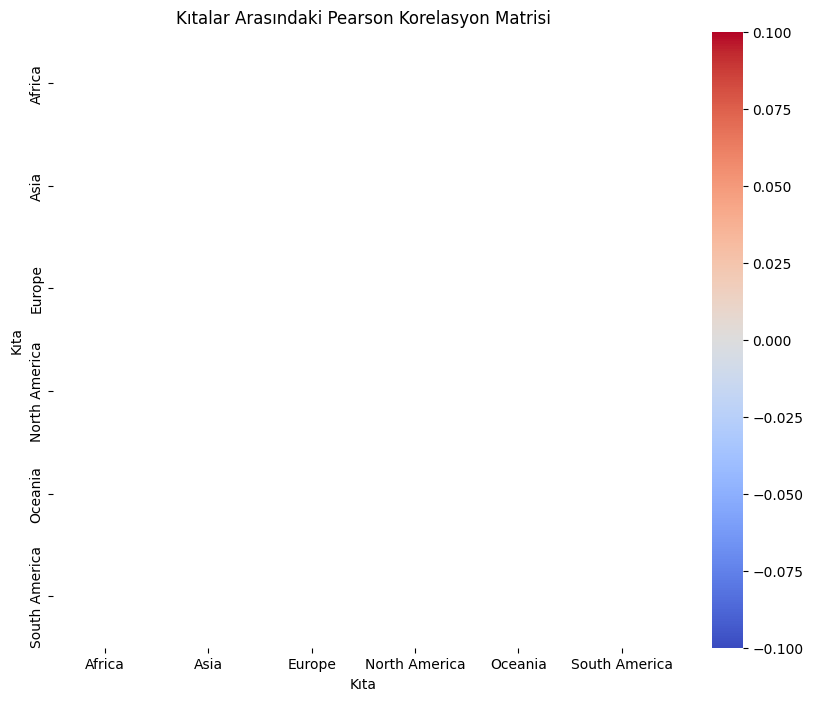

In [23]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Veri setini yükle
file_path = "average_ratio_all_entities.csv"
data = pd.read_csv(file_path)

# Kıta bilgilerini içeren bir sözlük
continents = {
    "Africa": ["Algeria", "Angola", "Benin", "Botswana", "Burkina Faso", "Burundi", "Cameroon", "Cape Verde",
               "Central African Republic", "Chad", "Comoros", "Congo", "Democratic Republic of Congo", "Djibouti",
               "Egypt", "Equatorial Guinea", "Eritrea", "Eswatini", "Ethiopia", "Gabon", "Gambia", "Ghana", "Guinea",
               "Guinea-Bissau", "Cote d'Ivoire", "Kenya", "Lesotho", "Liberia", "Libya", "Madagascar", "Malawi", "Mali",
               "Mauritania", "Mauritius", "Morocco", "Mozambique", "Namibia", "Niger", "Nigeria", "Rwanda", "Sao Tome and Principe",
               "Senegal", "Sierra Leone", "Somalia", "South Africa", "South Sudan", "Sudan", "Tanzania", "Togo", "Tunisia",
               "Uganda", "Zambia", "Zimbabwe"],
    "Asia": ["Afghanistan", "Armenia", "Azerbaijan", "Bahrain", "Bangladesh", "Bhutan", "Brunei", "Cambodia", "China",
             "East Timor", "Georgia", "India", "Indonesia", "Iran", "Iraq", "Israel", "Japan", "Jordan", "Kazakhstan",
             "Kuwait", "Kyrgyzstan", "Laos", "Lebanon", "Malaysia", "Maldives", "Mongolia", "Myanmar", "Nepal",
             "North Korea", "Oman", "Pakistan", "Philippines", "Qatar", "Saudi Arabia", "Singapore",
             "South Korea", "Sri Lanka", "Syria", "Tajikistan", "Thailand", "Turkey", "Turkmenistan", "United Arab Emirates",
             "Uzbekistan", "Vietnam", "Yemen"],
    "Europe": ["Albania", "Andorra", "Austria", "Belarus", "Belgium", "Bosnia and Herzegovina", "Bulgaria", "Croatia",
               "Cyprus", "Czechia", "Denmark", "Estonia", "Finland", "France", "Germany", "Greece", "Hungary",
               "Iceland", "Ireland", "Italy", "Kosovo", "Latvia", "Liechtenstein", "Lithuania", "Luxembourg", "Malta",
               "Moldova", "Monaco", "Montenegro", "Netherlands", "North Macedonia", "Norway", "Poland", "Portugal",
               "Romania", "Russia", "San Marino", "Serbia", "Slovakia", "Slovenia", "Spain", "Sweden", "Switzerland",
               "Ukraine", "United Kingdom", "Vatican City"],
    "North America": ["Antigua and Barbuda", "Bahamas", "Barbados", "Belize", "Canada", "Costa Rica", "Cuba", "Dominica",
                      "Dominican Republic", "El Salvador", "Grenada", "Guatemala", "Haiti", "Honduras", "Jamaica",
                      "Mexico", "Nicaragua", "Panama", "Saint Kitts and Nevis", "Saint Lucia", "Saint Vincent and the Grenadines",
                      "Trinidad and Tobago", "United States"],
    "Oceania": ["Australia", "Fiji", "Kiribati", "Marshall Islands", "Micronesia", "Nauru", "New Zealand", "Palau", "Papua New Guinea",
                "Samoa", "Solomon Islands", "Tonga", "Tuvalu", "Vanuatu"],
    "South America": ["Argentina", "Bolivia", "Brazil", "Chile", "Colombia", "Ecuador", "Guyana", "Paraguay", "Peru", "Suriname",
                       "Uruguay", "Venezuela"]
}

# Her kıtada bulunan ülkelerin ortalama oranlarını tutacak bir DataFrame oluştur
continent_data = pd.DataFrame(index=continents.keys(), columns=continents.keys())

# Her kıtada bulunan ülkelerin ortalama oranlarını hesapla
for continent1, countries1 in continents.items():
    for continent2, countries2 in continents.items():
        # Ortak ülkeleri bul
        common_countries = list(set(countries1) & set(countries2))
        # Ortalama oranı hesapla
        average_ratio = data[data['Entity'].isin(common_countries)]['Average_Ratio'].mean()
        # Veri çerçevesine ekle
        continent_data.loc[continent1, continent2] = average_ratio

# Korelasyon matrisini hesapla
correlation_matrix = continent_data.astype(float).corr()

# Korelasyon matrisini görselleştir
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=.5)
plt.title('Kıtalar Arasındaki Pearson Korelasyon Matrisi')
plt.xlabel('Kıta')
plt.ylabel('Kıta')
plt.show()


daha da kötü çıktı o yüzden kıta bazlı gitmek de işe yaramadığı için ülke bazlı yıllara göre değişimi izlemeye karar verdim.


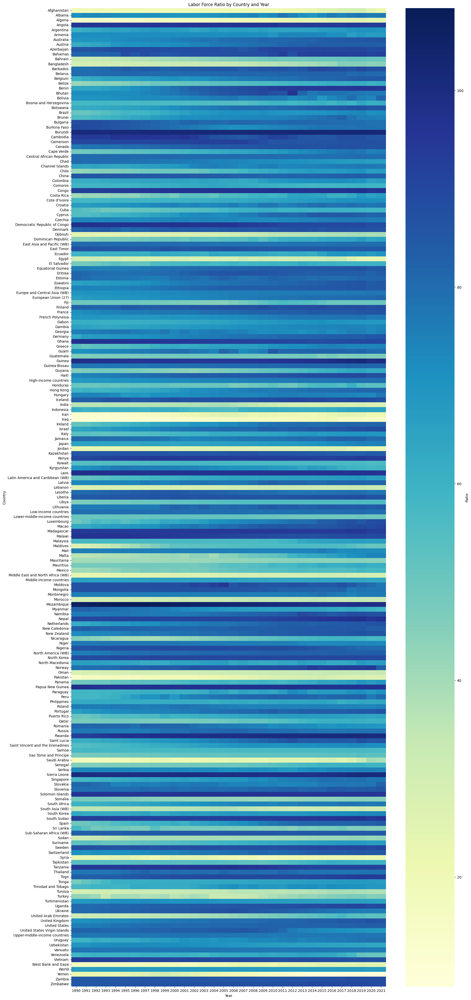

In [25]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Veri setini yükle
file_path = r"C:\Users\bitir\OneDrive\Desktop\UP\deneme\labor_forceratio.csv"
data = pd.read_csv(file_path)

# Her bir ülkenin yıllara göre oranlarını içeren bir ısı haritası oluştur
plt.figure(figsize=(20, 50))
heatmap = sns.heatmap(data.pivot_table(index="Entity", columns="Year", values="Ratio"), cmap="YlGnBu", annot=False, fmt=".1f", cbar_kws={'label': 'Ratio'})
plt.title("Labor Force Ratio by Country and Year")
plt.xlabel("Year")
plt.ylabel("Country")
plt.show()


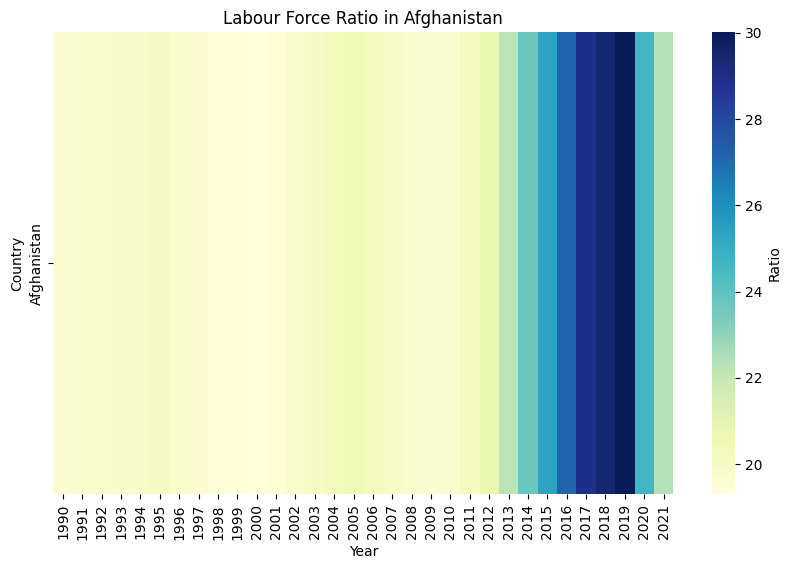

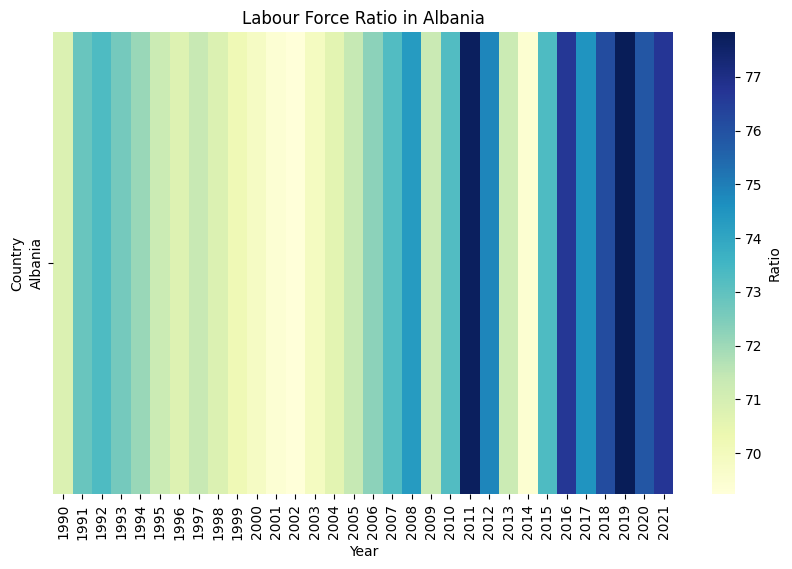

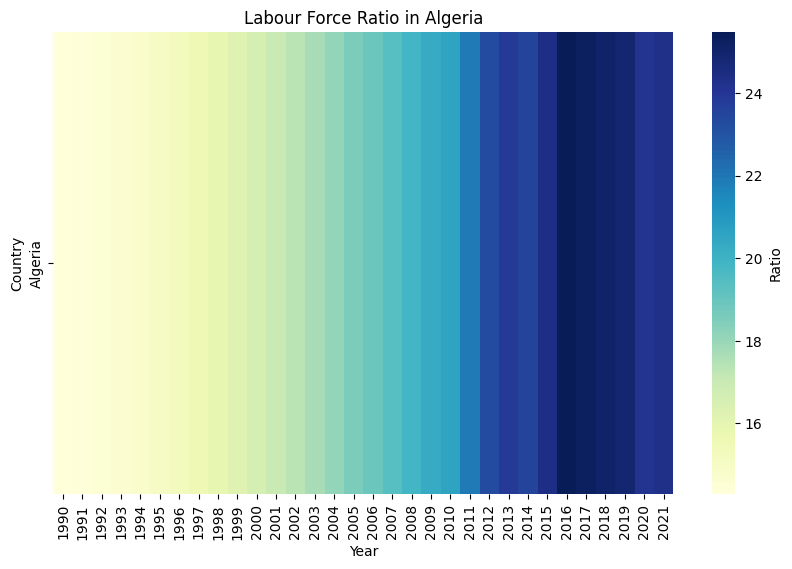

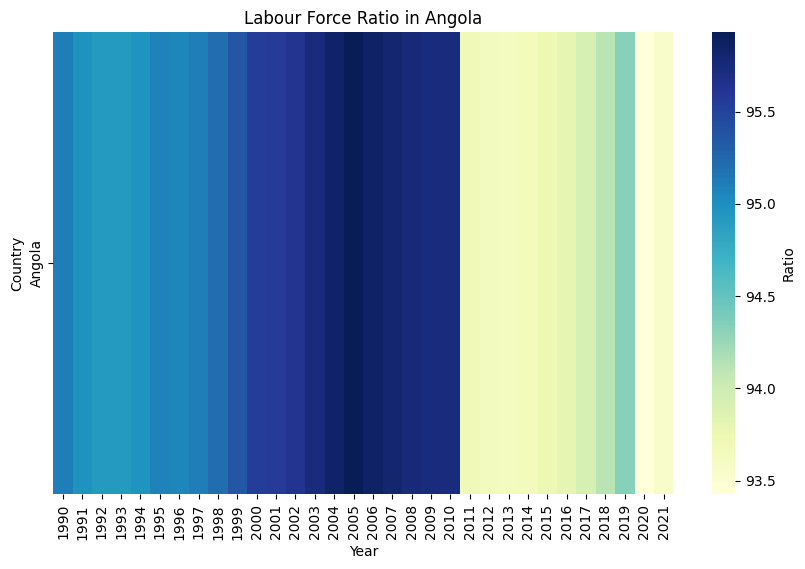

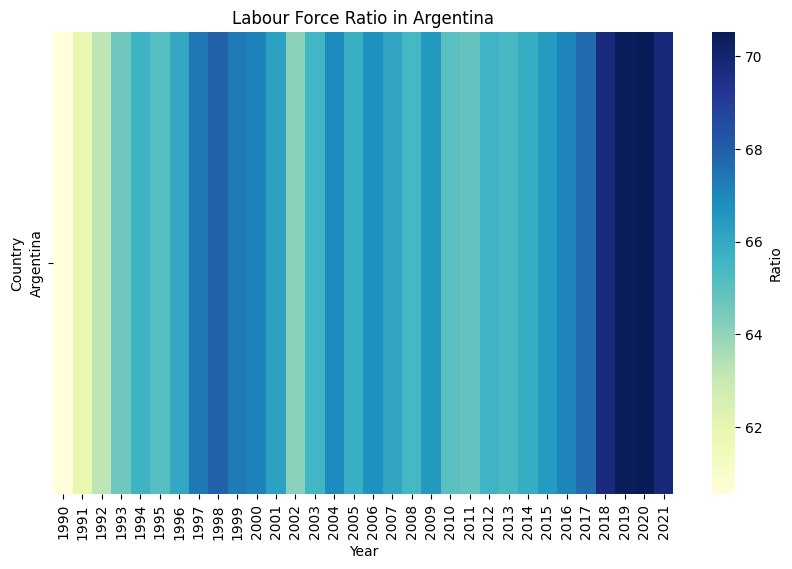

...

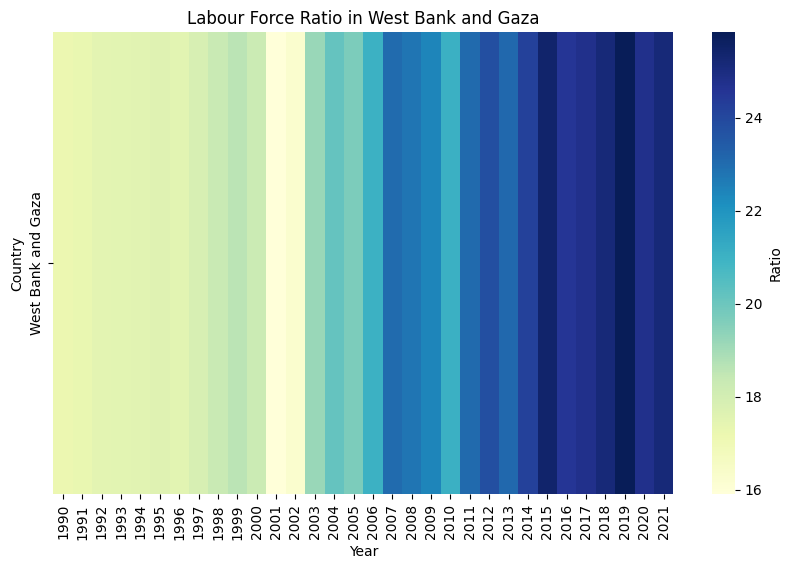

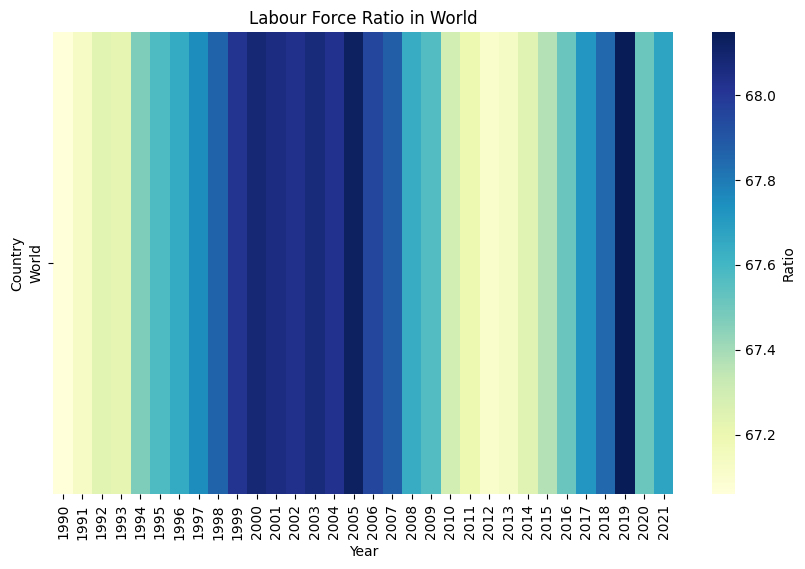

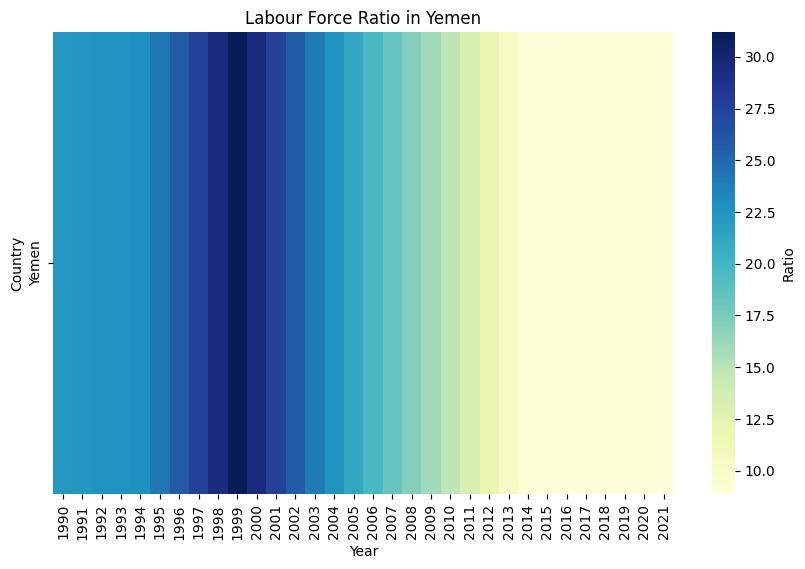

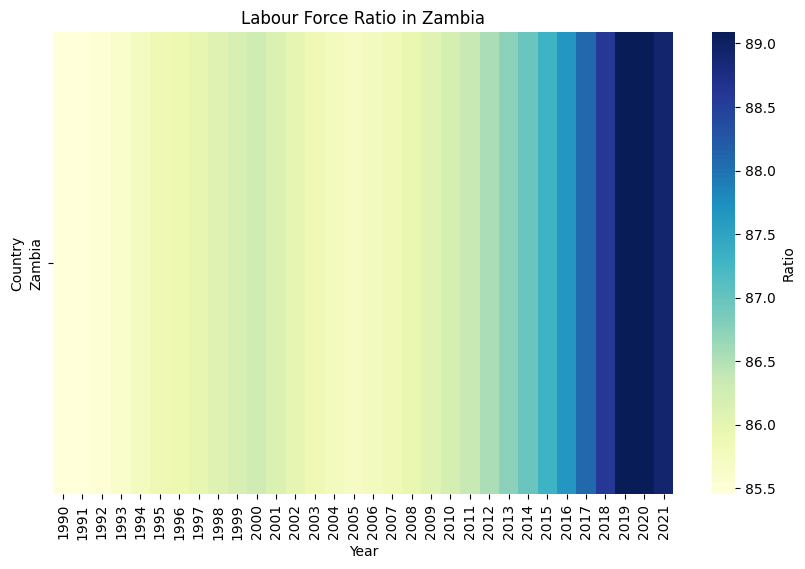

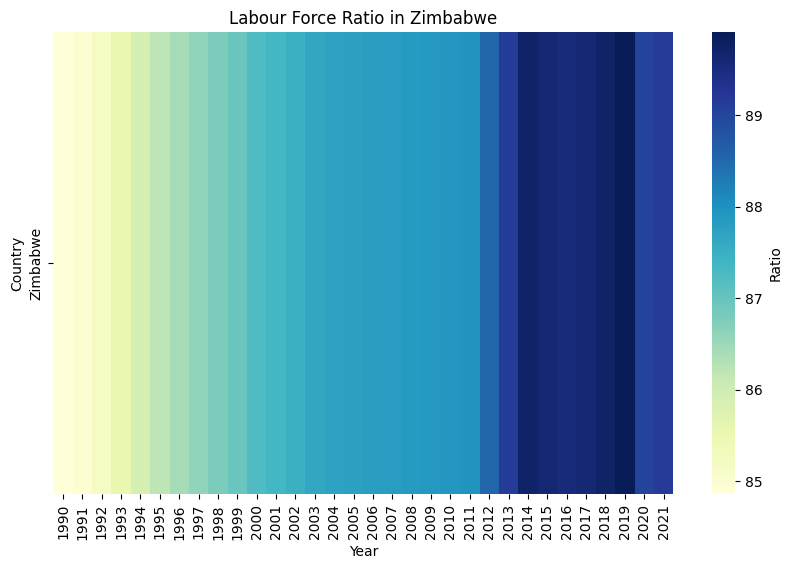

In [26]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Veri setini yükle
file_path = r"C:\Users\bitir\OneDrive\Desktop\UP\deneme\labor_forceratio.csv"
data = pd.read_csv(file_path)

# Her bir ülke için ayrı ısı haritası oluştur
for country in data['Entity'].unique():
    # Ülkeye özgü veri setini al
    country_data = data[data['Entity'] == country]
    
    # Veriyi yıllara göre pivotla
    pivot_data = country_data.pivot_table(index='Entity', columns='Year', values='Ratio')
    
    # Isı haritasını oluştur
    plt.figure(figsize=(10, 6))
    sns.heatmap(pivot_data, cmap='YlGnBu', annot=False, fmt=".1f", cbar_kws={'label': 'Ratio'})
    plt.title(f"Labour Force Ratio in {country}")
    plt.xlabel('Year')
    plt.ylabel('Country')
    plt.show()


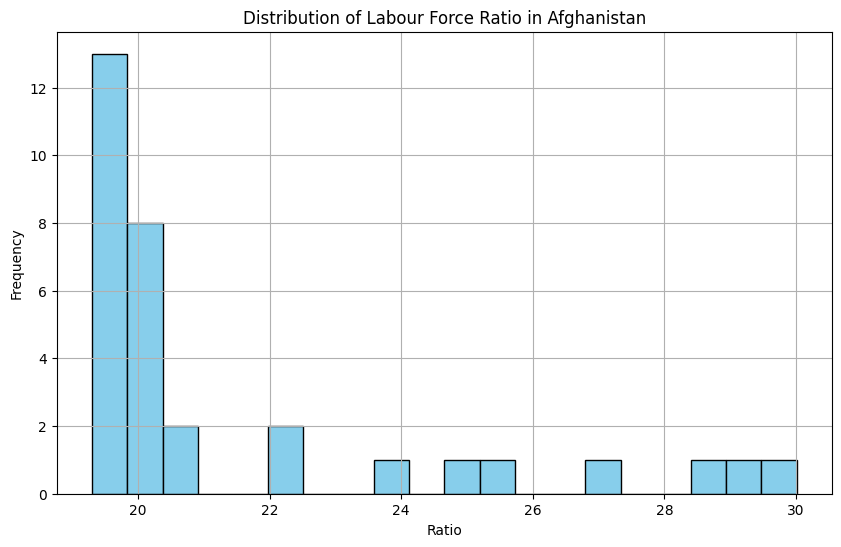

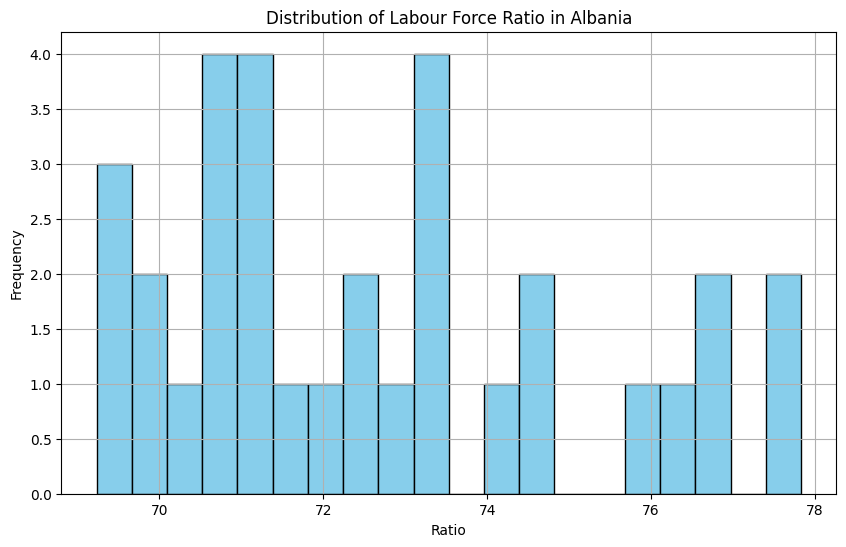

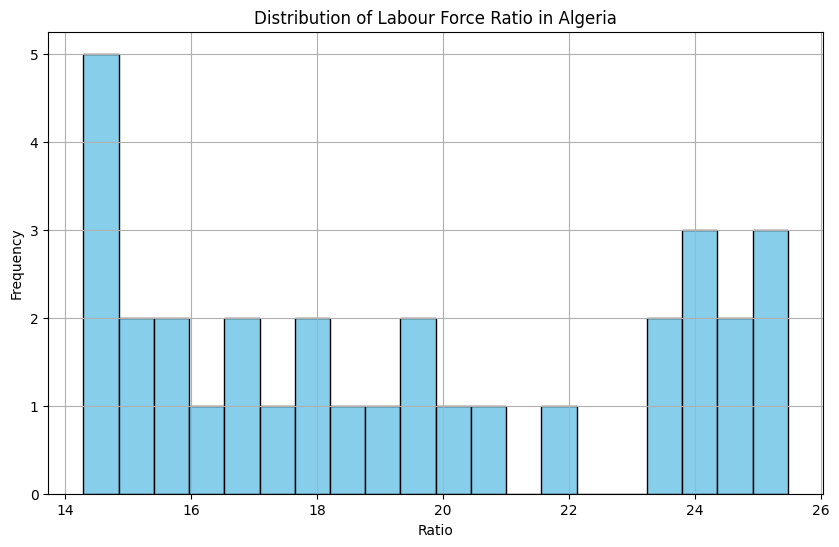

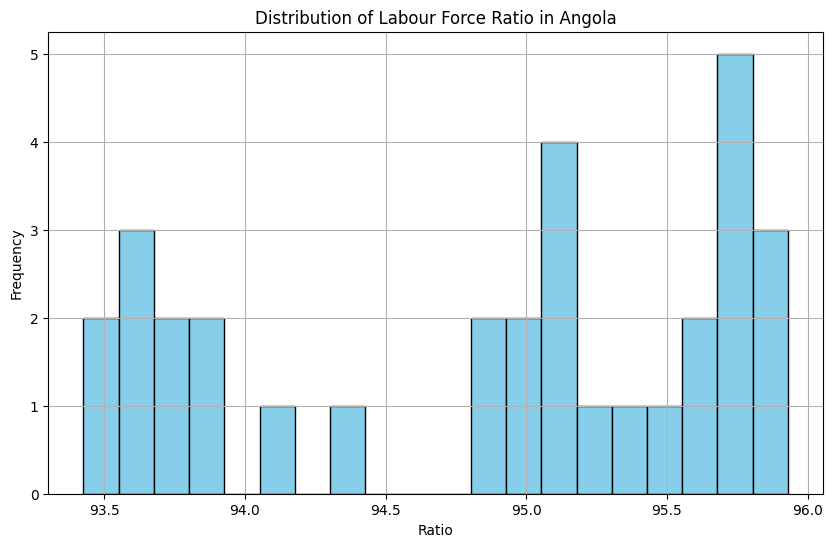

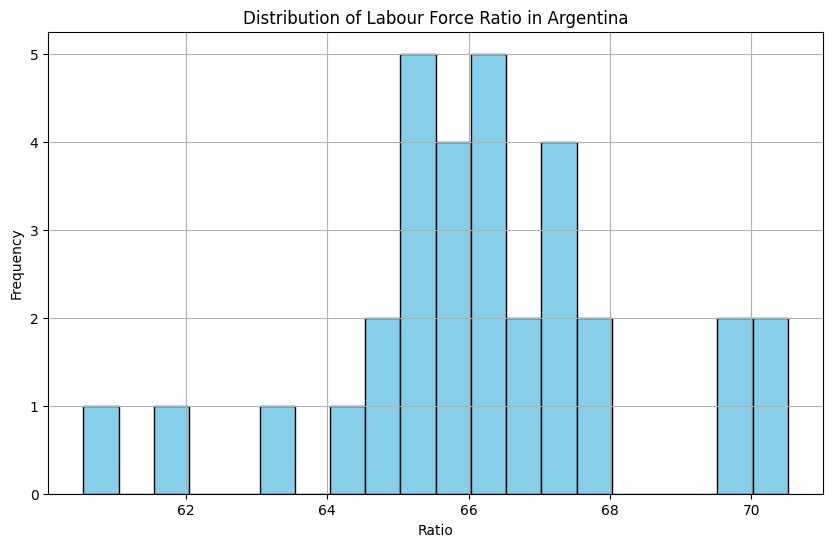

...

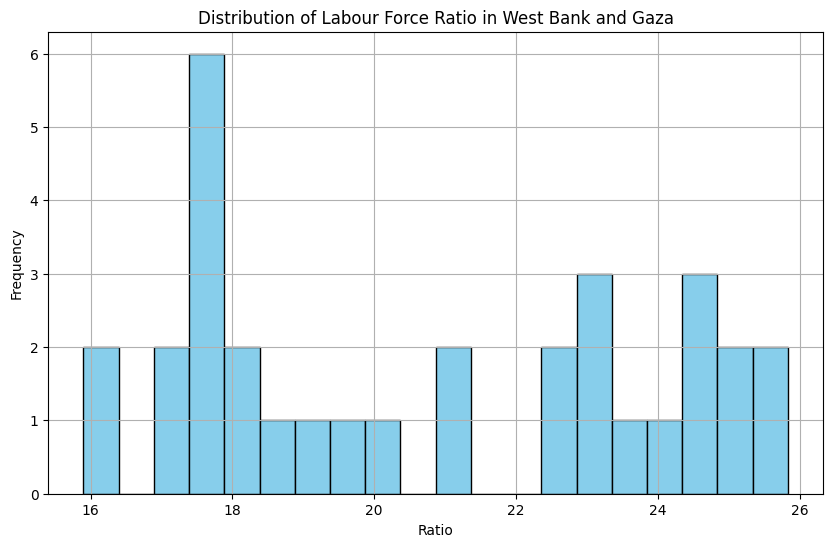

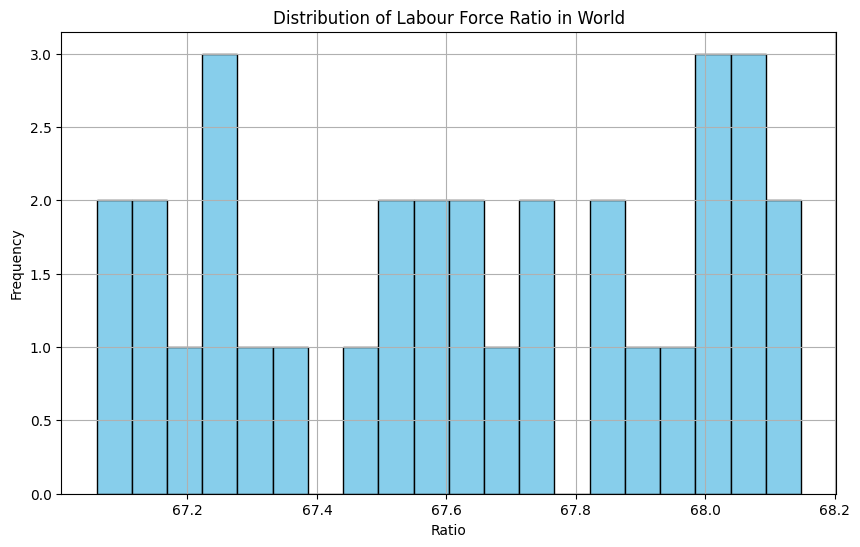

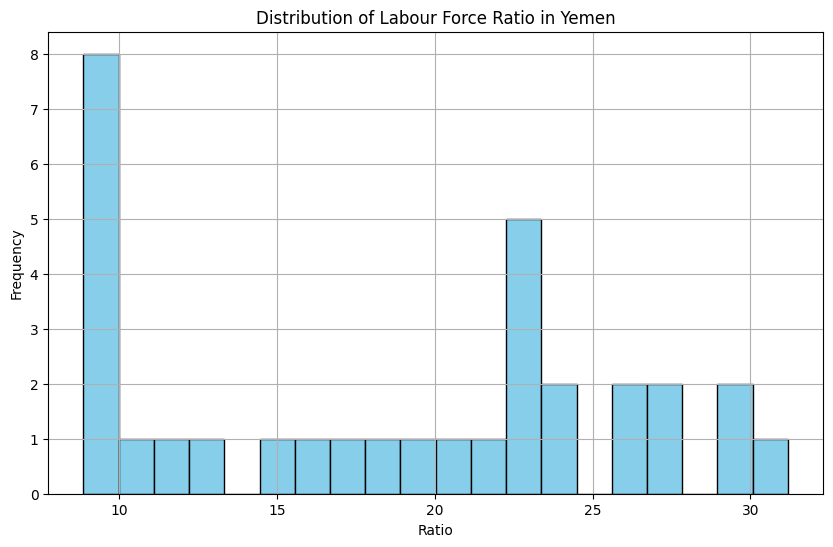

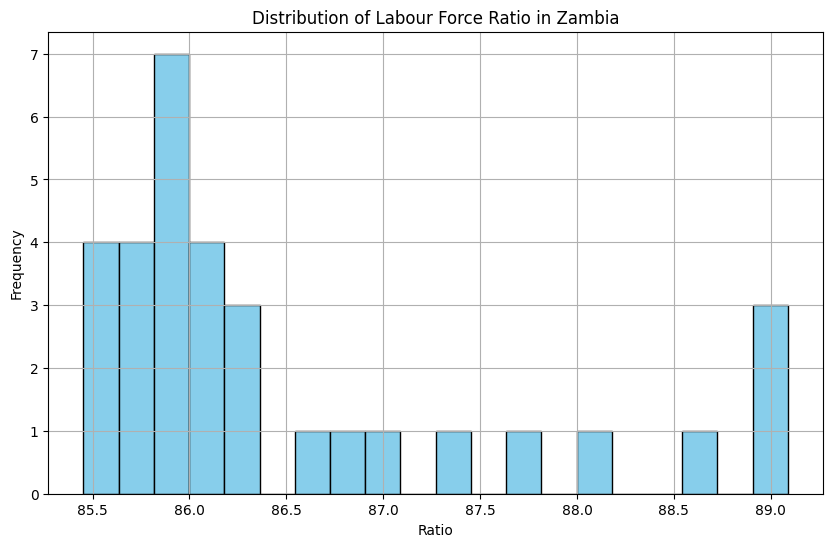

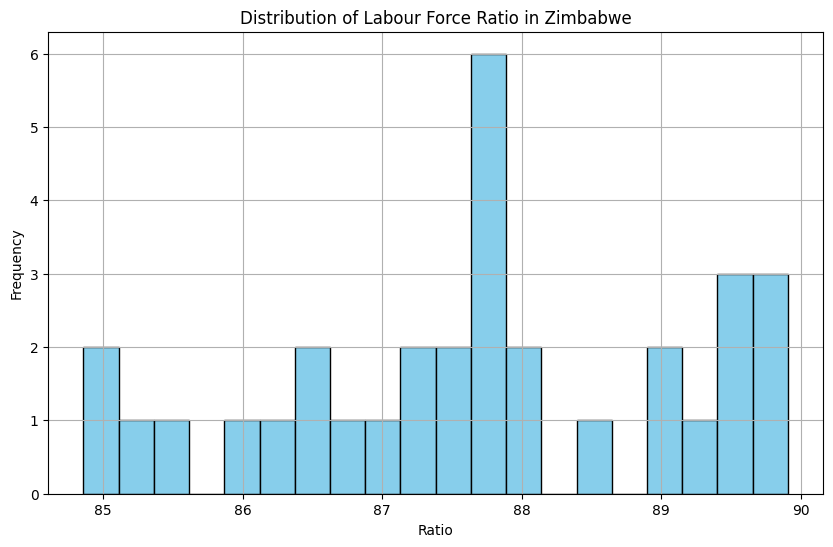

In [27]:
import pandas as pd
import matplotlib.pyplot as plt

# Veri setini yükle
file_path = r"C:\Users\bitir\OneDrive\Desktop\UP\deneme\labor_forceratio.csv"
data = pd.read_csv(file_path)

# Her bir ülke için ayrı histogramlar oluştur
for country in data['Entity'].unique():
    # Ülkeye özgü veri setini al
    country_data = data[data['Entity'] == country]
    
    # Histogramı oluştur
    plt.figure(figsize=(10, 6))
    plt.hist(country_data['Ratio'], bins=20, color='skyblue', edgecolor='black')
    plt.title(f"Distribution of Labour Force Ratio in {country}")
    plt.xlabel('Ratio')
    plt.ylabel('Frequency')
    plt.grid(True)
    plt.show()
